# Sumarize Results
- HYCOM forward simulation
    - simulated Green's function 
    - average ocean temperature
- estimated arrival times
    - hilbert magnitude
    - filterred to coherent cutoff

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy
from scipy import signal
from dask.distributed import Client
from oceans import sw_extras as sw
from matplotlib import gridspec
import seaborn as sns
import hvplot.xarray
from xrsignal import xrsignal
from NI_tools.NI_tools import inversion
from tqdm import tqdm
import ODLintake
import matplotlib
import xrft

# set the theme
sns.set_palette('inferno', 6)

plt.rcParams.update({
    'text.usetex':True,
    'font.family':'sans-serif',
    'font.size':18
})

%load_ext autoreload
%autoreload 2

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 62.80 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:46405,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 32
Started: Just now,Total memory: 62.80 GiB
Comm: tcp://127.0.0.1:46217,Total threads: 4
Dashboard: http://127.0.0.1:34181/status,Memory: 7.85 GiB
Nanny: tcp://127.0.0.1:34929,


## Look at Single Hydrophone Spectrograms

In [4]:
fn = '/datadrive/lfhydrophone/spectrograms/Eastern_Caldera.nc'
ec_spec = xr.open_dataarray(fn)

fn = '/datadrive/lfhydrophone/spectrograms/Central_Caldera.nc'
cc_spec = xr.open_dataarray(fn)

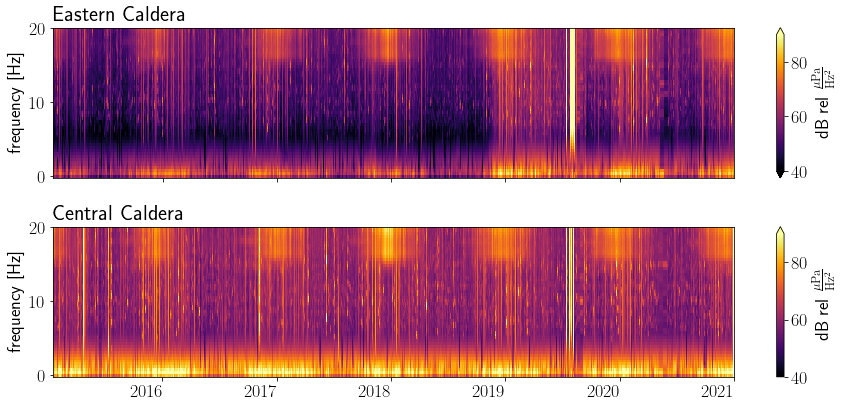

In [6]:
fig, axes = plt.subplots(2,1,figsize=(13,6))
                         
plt.sca(axes[0]) 
dtFmt = matplotlib.dates.DateFormatter('%Y') # define the formatting
axes[0].xaxis.set_major_formatter(dtFmt) 
ec_spec.loc[::100,:20].plot(x='time', cmap='inferno', cbar_kwargs={'label':'dB rel $\mathrm{\\frac{\mu Pa}{Hz^2}}$'}, ax=axes[0], vmax=90,vmin=40)
plt.ylabel('frequency [Hz]')
plt.title('Eastern Caldera', loc='left')
axes[0].set_xticklabels('')
plt.xlabel('')


plt.sca(axes[1]) 
dtFmt = matplotlib.dates.DateFormatter('%Y') # define the formatting
axes[1].xaxis.set_major_formatter(dtFmt) 
cc_spec.loc[::100,:20].plot(x='time', cmap='inferno', cbar_kwargs={'label':'dB rel $\mathrm{\\frac{\mu Pa}{Hz^2}}$'}, ax=axes[1], vmax=90,vmin=40)
plt.ylabel('frequency [Hz]')
_  = plt.xticks(pd.to_datetime(np.arange(pd.Timestamp('2016-01-01').value, pd.Timestamp('2022-01-01').value, 3600*24*366*1e9)),rotation=0)
plt.title('Central Caldera', loc='left')
plt.xlabel('')

plt.tight_layout()

fig.savefig('figures/spectrogram.png', dpi=300)

## Peak Spectrums

In [3]:
fn = '/datadrive/NCCFs/1hr_20150101_20230101_ec_cc.nc'
NCCFs = xr.open_dataarray(fn)
NCCFs = NCCFs.chunk({'time':100, 'delay':11999})

time_coord = pd.date_range(pd.Timestamp('2015-01-01'), pd.Timestamp('2022-12-31T23:59:59.999999'), freq='1H')
NCCFs = NCCFs.assign_coords({'time':time_coord})

In [4]:
NCCFs_201 = NCCFs.rolling(time=201, center=True, min_periods=100).mean()

In [5]:
NCCFs

<xarray.DataArray 'random_sample-ee3db8cfae86a32195d4ba600f7a3975' (
                                                                    time: 70128,
                                                                    delay: 11999)>
dask.array<xarray-<this-array>, shape=(70128, 11999), dtype=float64, chunksize=(100, 11999), chunktype=numpy.ndarray>
Coordinates:
  * delay    (delay) float64 -30.0 -29.99 -29.99 -29.98 ... 29.98 29.99 29.99
  * time     (time) datetime64[ns] 2015-01-01 ... 2022-12-31T23:00:00

In [6]:
s1b0A_t = NCCFs_201.loc[:,-3.5:-2.5]
s1b0B_t = NCCFs_201.loc[:,2.5:3.5]

In [7]:
s1b0A_f = np.abs(xrft.fft(s1b0A_t, dim='delay')).sel({'freq_delay':slice(0,100)}).isel({'time':slice(0,-1,201)}).compute()
s1b0B_f = np.abs(xrft.fft(s1b0B_t, dim='delay')).sel({'freq_delay':slice(0,100)}).isel({'time':slice(0,-1,201)}).compute()

In [8]:
s1b0A_f.name = 's1b0A'
s1b0B_f.name = 's1b0B'

In [9]:
s1b0A_f

<xarray.DataArray 's1b0A' (time: 349, freq_delay: 100)>
array([[           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [2.52781218e-05, 5.85153178e-05, 1.53434298e-04, ...,
        3.00995675e-07, 2.88428766e-07, 2.80915514e-07],
       ...,
       [3.77513681e-05, 7.85701459e-05, 1.68891090e-04, ...,
        5.75764866e-07, 5.71809477e-07, 5.69488482e-07],
       [4.35659975e-05, 8.67202075e-05, 1.61884810e-04, ...,
        1.73574088e-06, 1.70351063e-06, 1.68494924e-06],
       [4.22456548e-05, 8.09454680e-05, 1.66203734e-04, ...,
        2.87710264e-07, 2.75535589e-07, 2.68622710e-07]])
Coordinates:
  * time        (time) datetime64[ns] 2015-01-01 ... 2022-12-24T12:00:00
  * freq_delay  (freq_delay) float64 0.0 1.0 2.0 3.0 4.0 ... 96.0 97.0 98.0 99.0

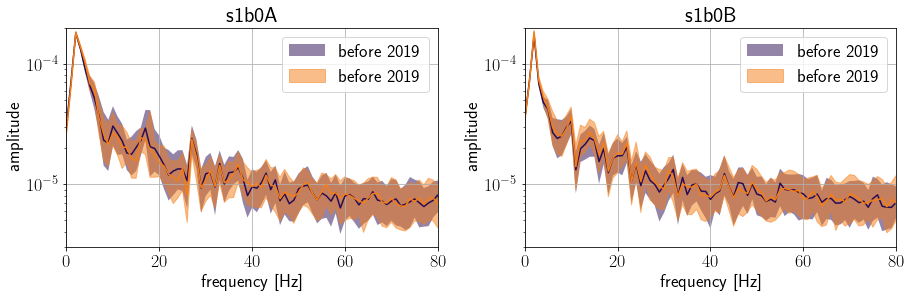

In [53]:
quantiles_before_A = s1b0A_f.loc[:pd.Timestamp('2019-01-01')].quantile(q=[0.25, 0.5, 0.75], dim='time')
quantiles_after_A = s1b0A_f.loc[pd.Timestamp('2019-01-01'):].quantile(q=[0.25, 0.5, 0.75], dim='time')

quantiles_before_B = s1b0B_f.loc[:pd.Timestamp('2019-01-01')].quantile(q=[0.25, 0.5, 0.75], dim='time')
quantiles_after_B = s1b0B_f.loc[pd.Timestamp('2019-01-01'):].quantile(q=[0.25, 0.5, 0.75], dim='time')

fig, axes = plt.subplots(1,2,figsize=(13,4.5))

plt.sca(axes[0])
quantiles_before_A[1,:].plot.line(c='C0')
quantiles_after_A[1,:].plot.line(c='C4')
plt.yscale('log')
plt.fill_between(quantiles_before_A.freq_delay, quantiles_before_A[0,:], quantiles_before_A[2,:], alpha=0.5, label='before 2019')
plt.fill_between(quantiles_after_A.freq_delay, quantiles_after_A[0,:], quantiles_after_A[2,:], alpha=0.5, label='before 2019', color='C4')

plt.grid()
plt.xlim([0,80])
plt.title('s1b0A')
plt.legend()
plt.ylim([3e-6, 2e-4])
plt.xlabel('frequency [Hz]')
plt.ylabel('amplitude')

plt.sca(axes[1])
quantiles_before_B[1,:].plot.line(c='C0')
quantiles_after_B[1,:].plot.line(c='C4')
plt.yscale('log')
plt.fill_between(quantiles_before_B.freq_delay, quantiles_before_B[0,:], quantiles_before_B[2,:], alpha=0.5, label='before 2019')
plt.fill_between(quantiles_after_B.freq_delay, quantiles_after_B[0,:], quantiles_after_B[2,:], alpha=0.5, label='before 2019', color='C4')

plt.grid()
plt.xlim([0,80])
plt.title('s1b0B')
plt.legend()
plt.ylim([3e-6, 2e-4])
plt.xlabel('frequency [Hz]')
plt.ylabel('amplitude')

plt.tight_layout()
fig.savefig('figures/peak_spectrum.svg')

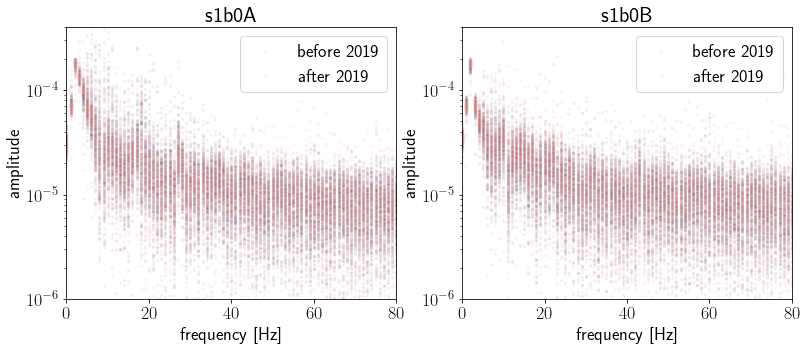

In [71]:
fig, axes = plt.subplots(1,2, figsize=(13,5))

plt.sca(axes[0])
s1b0A_f.loc[:pd.Timestamp('2019-01-1')].plot.scatter(x='freq_delay', alpha=0.06, s=10, label='before 2019')
s1b0A_f.loc[pd.Timestamp('2019-01-1'):].plot.scatter(x='freq_delay', alpha=0.06, s=10, label='after 2019', c='C3')
plt.yscale('log')
plt.ylim([1e-6, 4e-4])
plt.xlim([0,80])
plt.ylabel('amplitude')
plt.title('s1b0A')
plt.legend()
plt.xlabel('frequency [Hz]')

plt.sca(axes[1])
s1b0B_f.loc[:pd.Timestamp('2019-01-1')].plot.scatter(x='freq_delay', alpha=0.06, s=10, label='before 2019')
s1b0B_f.loc[pd.Timestamp('2019-01-1'):].plot.scatter(x='freq_delay', alpha=0.06, s=10, label='after 2019', c='C3')
plt.yscale('log')
plt.ylim([1e-6, 4e-4])
plt.xlim([0,80])
plt.ylabel('amplitude')
plt.title('s1b0B')
plt.legend()
plt.xlabel('frequency [Hz]')

fig.savefig('figures/before_after_2019_peak_spec.png', dpi=300)

In [89]:
s1b0A_f.hvplot.bivariate('delay_frequency', 'time')

Invoked as dynamic_operation(0.0)


DataError: Supplied data does not contain specified dimensions, the following dimensions were not found: ['delay_frequency']

PandasInterface expects tabular data, for more information on supported datatypes see http://holoviews.org/user_guide/Tabular_Datasets.html

:DynamicMap   [freq_delay]

## HYCOM

In [4]:
fn = '/datadrive/HYCOM_data/Axial_Seamount_earthengine/*.nc'
hycom = xr.open_mfdataset(fn)

In [7]:
ssp = sw.soundspeed(hycom.salinity, hycom.temperature, hycom.depth)
ssp.name = ['sound speed profile']
ssp.attrs = {'units':'m/s'}
# interpolate for smoother plot
ssp = ssp.load().interpolate_na(dim='time')

In [72]:
ssp_interp = ssp[:,:-5].interp(depth=np.arange(0,1500, 0.5), method='cubic')

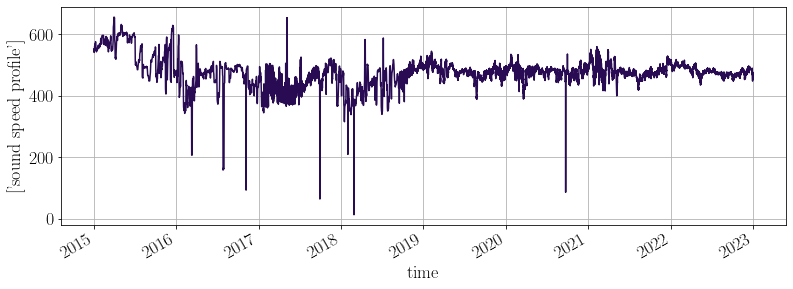

In [24]:
plt.figure(figsize=(13,4))
ssp_interp.argmin(dim='depth').plot()
plt.grid()

### plot HYCOM data

In [28]:
hycom_1m = hycom.interp(coords={'depth':np.arange(0,1500)}).compute()

temperature = hycom_1m.temperature
#remove outliers
temperature.loc[pd.Timestamp('2018-02-27')] = np.nan
temperature.loc[pd.Timestamp('2020-09-21T21:00:00')] = np.nan
temperature.loc[pd.Timestamp('2020-09-29T18:00:00')] = np.nan

salinity = hycom_1m.salinity
#remove outliers
salinity.loc[pd.Timestamp('2018-02-27')] = np.nan
salinity.loc[pd.Timestamp('2020-09-21T21:00:00')] = np.nan
salinity.loc[pd.Timestamp('2020-09-29T18:00:00')] = np.nan

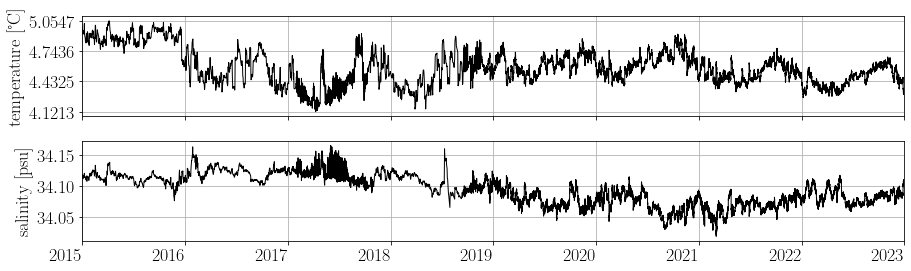

In [23]:
avg_temp = temperature.mean('depth')
avg_sal = salinity.mean('depth')

fig = plt.figure(figsize=(13,4))

gs = gridspec.GridSpec(2,1)
ax_temp = fig.add_subplot(gs[0,:])
ax_sal = fig.add_subplot(gs[1,:])

plt.sca(ax_temp)
avg_temp.plot(c='k', linewidth=1, ax=ax_temp)
plt.grid()
plt.ylabel('temperature [°C]')
ax_temp.set_xticklabels('')
_ = plt.yticks(np.linspace(avg_temp.min(), avg_temp.max(), 4))
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])
plt.xlabel('')


plt.sca(ax_sal)
avg_sal.plot(c='k', linewidth=1, ax=ax_sal)
plt.grid()
plt.ylabel('salinity [psu]')
plt.xticks(rotation=0)
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])
plt.xlabel('')

plt.tight_layout()
#fig.savefig('figures/average_HYCOM_temp_sal.svg')

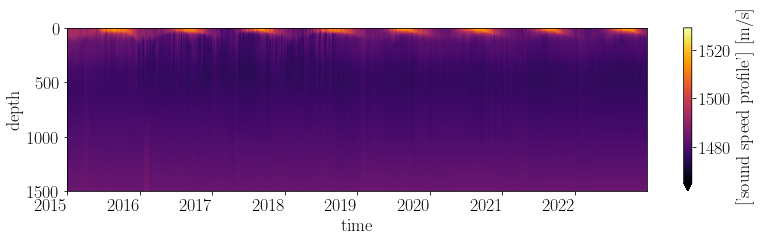

In [41]:
fig = plt.figure(figsize=(13,3))

ssp.plot(x='time', cmap='inferno', vmin=1465)
plt.ylim([1500,0])
_ = plt.xticks(rotation=0)

fig.savefig('figures/hycom_ssp.png', dpi=300)

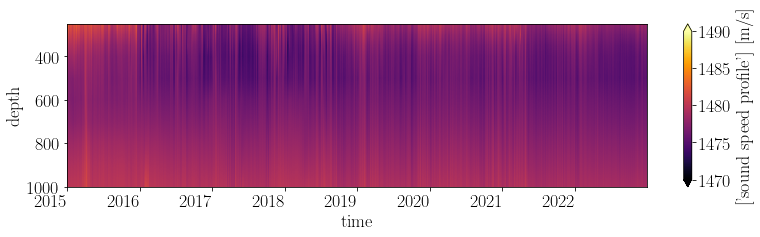

In [43]:
fig = plt.figure(figsize=(13,3))

ssp.plot(x='time', cmap='inferno', vmax=1490, vmin=1470)
plt.ylim([1000,250])
_ = plt.xticks(rotation=0)

fig.savefig('figures/hycom_ssp_zoomed.png', dpi=300)

In [33]:
ssp.name='ssp'
ssp.hvplot(x='time', y='depth', rasterize=True, cmap='inferno')

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


:DynamicMap   []
   :Image   [time,depth]   (ssp)

### Plot simulated arrival times

In [26]:
fc_list = [0.01, 0.4]

fn = '/datadrive/simulation/caldera_inversion_timeseries_HYCOM2.nc'
temp_sim = xr.open_dataarray(fn)
temp_sim = temp_sim.chunk({'date':100, 'time':6000})

In [27]:
fc_list = [[0.01, 0.9], [0.01, 0.4], [0.01, 0.3], [0.01, 0.2], [0.01, 0.1], [0.01, 0.05]]
fc_list = [[0.01, 0.9]]
prop_times = []

temp_sims = []
for fcs in tqdm(fc_list):
    b,a = signal.butter(4, fcs, btype='bandpass')
    temp_sim_c = xrsignal.hilbert_mag(xrsignal.filtfilt(temp_sim, dim='time', b=b, a=a), dim='time')
    
    temp_sims.append(temp_sim_c[0])
    
    fake_nccf = xr.DataArray(np.hstack((np.flip(temp_sim_c.values[:,1:], axis=1), temp_sim_c.values)), dims=['dates','delay'], coords={'dates':temp_sim_c.date.values, 'delay':np.linspace(-29.995, 29.995, 11999)})
    prop_times.append(inversion._calc_prop_times_chunk(xr.Dataset({'temp_sim':fake_nccf}), peak_names = ['s1b0B', 's2b1B', 'dA'])['temp_sim'])


100%|█████████████████████████████████████████████| 6/6 [01:10<00:00, 11.78s/it]


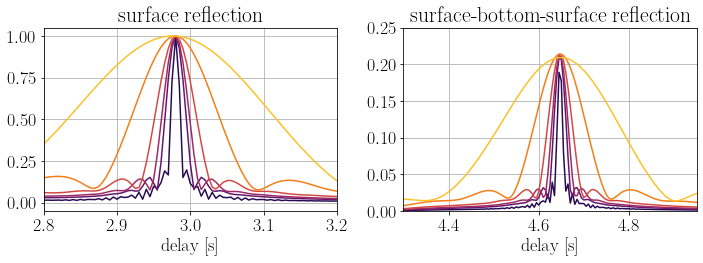

In [163]:
fig, axes = plt.subplots(1,2,figsize=(10,4))

for temp_sim in temp_sims:
    (temp_sim/temp_sim.max()).plot(ax=axes[0])
    (temp_sim/temp_sim.max()).plot(ax=axes[1])
    
plt.sca(axes[0])
plt.xlim([2.8,3.2])
plt.grid()
plt.ylabel('')
plt.title('surface reflection')
plt.xlabel('delay [s]')

plt.sca(axes[1])
plt.xlim([4.3,4.95])
plt.grid()
plt.ylabel('')
plt.title('surface-bottom-surface reflection')
plt.xlabel('delay [s]')
plt.ylim([0, 0.25])

plt.tight_layout()

fig.savefig('figures/tdgf_arrivals_zoomed.png', dpi=300)

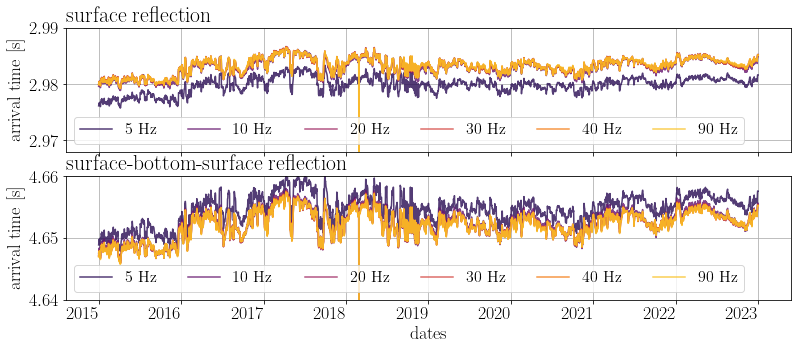

In [144]:
fig,axes=plt.subplots(2,1,figsize=(13,5))

axes = axes.flatten()

labels=['90', '40', '30', '20', '10', '5']

for k in range(5,-1,-1):
    plt.sca(axes[0])
    prop_times[k].loc['s1b0B'].plot(label=f'{labels[k]} Hz', alpha=0.8)
    plt.sca(axes[1])
    prop_times[k].loc['s2b1B'].plot(label=f'{labels[k]} Hz', alpha=0.8)

plt.sca(axes[0])
plt.grid()
plt.ylim([2.968,2.99])
plt.title('')
plt.title('surface reflection', loc='left')
axes[0].set_xticklabels('')
plt.xlabel('')
plt.legend(ncol=6, fontsize=16)
plt.ylabel('arrival time [s]')


plt.sca(axes[1])
plt.grid()
plt.ylim([4.64, 4.66])
plt.title('')
plt.title('surface-bottom-surface reflection', loc='left')
plt.legend(ncol=6, fontsize=16)
plt.xticks(rotation=0)
plt.ylabel('arrival time [s]')

fig.savefig('figures/freq_band_arrival_times.png', dpi=300)

In [80]:
ssp_min_depth = ssp_interp.depth[ssp_interp.argmin(dim='depth')]

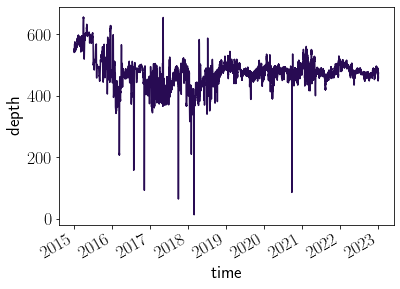

In [82]:
ssp_min_depth.plot()

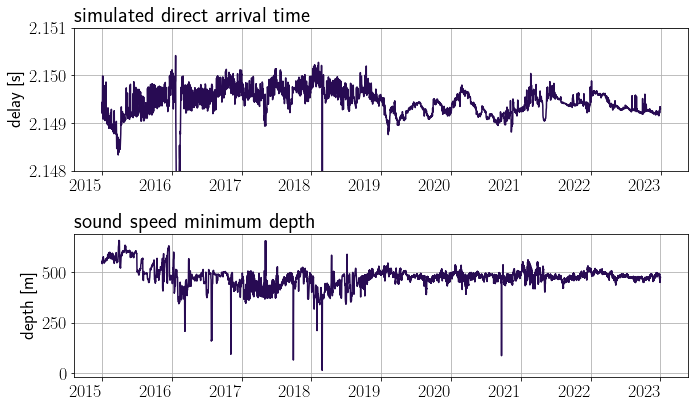

In [89]:
fig, axes= plt.subplots(2,1, figsize=(10,6))

plt.sca(axes[0])
(-1*prop_times[0]).loc['dA'].plot(ax=axes[0])
plt.grid()
plt.title('')
plt.ylabel('delay [s]')
plt.xlabel('')
_ = plt.xticks(rotation=0)
plt.ylim([2.148, 2.151])
plt.title('simulated direct arrival time', loc='left')

plt.sca(axes[1])
ssp_min_depth.plot(ax=axes[1])
plt.grid()
plt.title('')
plt.ylabel('depth [m]')
plt.xlabel('')
_ = plt.xticks(rotation=0)
plt.title('sound speed minimum depth', loc='left')

plt.tight_layout()

fig.savefig('figures/simulated_arrival_ssp_depth.png', dpi=300)

## Estimated Arrivals

In [34]:
fn = '/datadrive/simulation/caldera_inversion_timeseries_HYCOM2.nc'
temp_sim = xr.open_dataarray(fn)
temp_sim = temp_sim.chunk({'date':100, 'time':6000})

In [71]:
fc_list = [[0.01, 0.9], [0.01, 0.4], [0.01, 0.3], [0.01, 0.2], [0.01, 0.1], [0.01, 0.05]]
fc_list = [[0.01, 0.9]]
prop_times = []

temp_sims = []
for fcs in tqdm(fc_list):
    b,a = signal.butter(4, fcs, btype='bandpass')
    temp_sim_c = xrsignal.hilbert_mag(xrsignal.filtfilt(temp_sim, dim='time', b=b, a=a), dim='time')
    
    temp_sims.append(temp_sim_c[0])
    
    fake_nccf = xr.DataArray(np.hstack((np.flip(temp_sim_c.values[:,1:], axis=1), temp_sim_c.values)), dims=['dates','delay'], coords={'dates':temp_sim_c.date.values, 'delay':np.linspace(-29.995, 29.995, 11999)})
    prop_times.append(inversion._calc_prop_times_chunk(xr.Dataset({'temp_sim':fake_nccf}), peak_names = ['s1b0B', 's2b1B', 'dA'])['temp_sim'])


100%|███████████████████████████████████████████████████████████████████████| 1/1 [00:11<00:00, 11.14s/it]


In [40]:
prop_times_hr = prop_times[0].interp(dates=pd.date_range(pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01'), freq='1H'), method='cubic')

In [52]:
prop_times_avghour = {
    201:prop_times_hr.rolling(dates=201, center=True).mean(),
    601:prop_times_hr.rolling(dates=601, center=True).mean(),
    1001:prop_times_hr.rolling(dates=1001, center=True).mean()
}

In [5]:
avg_hours = [201, 601, 1001]
ats = {}

for avg_hour in avg_hours:
    fn = f'/datadrive/NCCFs/arrival_times/outlier3_avghour{avg_hour}.nc'
    at = xr.open_dataset(fn)
    ats[avg_hour] = at

(-0.45, 9.45)

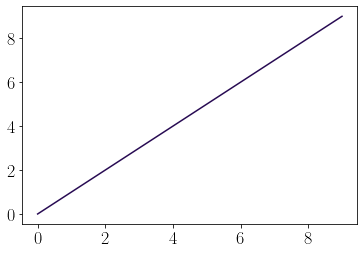

In [93]:
plt.plot(np.arange(10))
plt.ylim(None)

In [127]:
peak_names = ['dA', 's1b0A', 's1b0B', 's2b1A', 's2b1B']
sim_peak_names = ['dA', 's1b0B', 's1b0B', 's2b1B','s2b1B']
offsets = [-0.018, 0.005, 0.007, 0.005, 0.007]
ylims = [None,[2.984, 2.993],[2.984, 3], [4.65,4.665], [4.65,4.689]]

for k, peak_name in enumerate(tqdm(peak_names)):
    
    fig, axes = plt.subplots(3,1,figsize=(13,6))
    fig.suptitle(f'{peak_name}\t offset: {offsets[k]*1000} ms')


    plt.sca(axes[0])
    if peak_name[-1] == 'A':
        (-1*ats[201][peak_name]).plot()
    else:
        ats[201][peak_name].plot(c='C0')
    if peak_name == 'dA':
        (-1*prop_times_avghour[201] + offsets[k]).loc[sim_peak_names[k]].plot(ax=axes[0], c='C4')
    else:
        (prop_times_avghour[201] + offsets[k]).loc[sim_peak_names[k]].plot(ax=axes[0], c='C4')

    _ = axes[0].set_xticklabels('')
    plt.xlabel('')
    plt.grid()
    plt.ylabel('[s]')
    plt.title('')
    plt.title('201 hours', loc='left')
    plt.ylim(ylims[k])

    plt.sca(axes[1])
    if peak_name[-1] == 'A':
        (-1*ats[601][peak_name]).plot()
    else:
        ats[601][peak_name].plot(c='C0')

    if peak_name == 'dA':
        (-1*prop_times_avghour[601] + offsets[k]).loc[sim_peak_names[k]].plot(ax=axes[1], c='C4')
    else:
        (prop_times_avghour[601]+offsets[k]).loc[sim_peak_names[k]].plot(ax=axes[1], c='C4')

    #plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])
    _ = axes[1].set_xticklabels('')
    plt.xlabel('')
    plt.grid()
    plt.ylabel('[s]')
    plt.title('')
    plt.title('601 hours', loc='left')
    plt.ylim(ylims[k])

    plt.sca(axes[2])
    if peak_name[-1] == 'A':
        (-1*ats[1001][peak_name]).plot()
    else:
        ats[1001][peak_name].plot(c='C0')

    if peak_name == 'dA':
        (-1*prop_times_avghour[1001] + offsets[k]).loc[sim_peak_names[k]].plot(ax=axes[2], c='C4')
    else:
        (prop_times_avghour[1001] + offsets[k]).loc[sim_peak_names[k]].plot(ax=axes[2], c='C4')

    #plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])
    plt.xticks(rotation=0)
    plt.xlabel('')
    plt.grid()
    plt.ylabel('[s]')
    plt.title('')
    plt.title('1001 hours', loc='left')
    plt.ylim(ylims[k])

    plt.tight_layout()

    fig.savefig(f'figures/arrival_times/{peak_name}.svg')
    plt.close()

100%|███████████████████████████████████████████████████████████████████████| 5/5 [00:05<00:00,  1.08s/it]


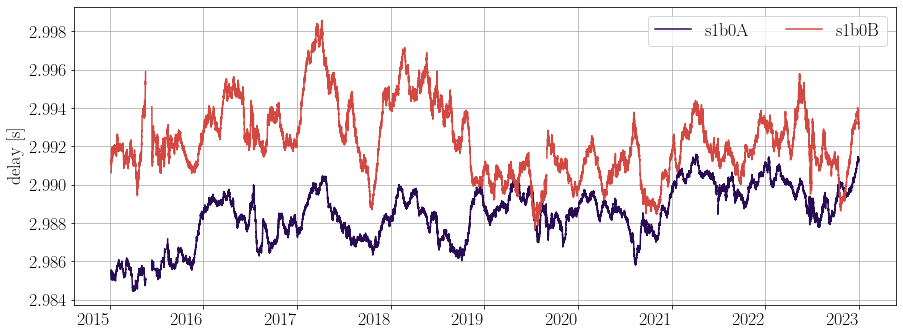

In [49]:
fig = plt.figure(figsize=(13,5))
(-1*at['s1b0A']).plot(label='s1b0A')
at['s1b0B'].plot(label='s1b0B', c='C3')
plt.grid()
plt.legend(ncol=2)
_ = plt.xticks(rotation=0)
plt.ylabel('delay [s]')
plt.xlabel('')

plt.tight_layout()

fig.savefig('figures/lag_lead_difference.png', dpi=300)